# ЛР 2 — Коррекция яркости и цвета

*Зубарева Марина, РИМ-181226*

In [1]:
from skimage.io import imread, imshow, imsave
from numpy import histogram, dstack, average
from numpy import clip
import numpy as np
from numpy import dstack
from matplotlib import pyplot as plt

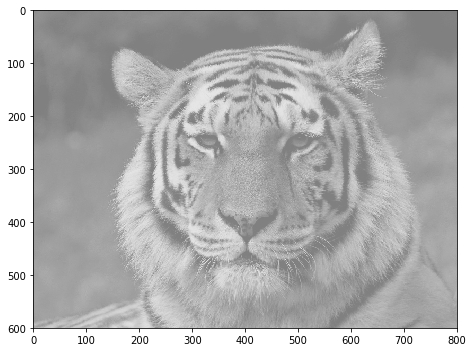

In [2]:
img=imread ("https://stepik.org/media/attachments/lesson/58402/tiger-low-contrast.png")
plt.figure(figsize=(10,5))
imshow(img)

In [3]:
def compare_img(img1, img2):
    fig = plt.figure(figsize=(20, 10))
    
    fig.add_subplot(1, 2, 1)
    imshow(img1)
    
    fig.add_subplot(1, 2, 2)
    imshow(img2)
    
    plt.show()

## Автоконтраст

In [4]:
def linear_stretching(x, Xmin, Xmax, isFloat = False):
    stretched = ((x - Xmin) * (1 if isFloat else 255) / (Xmax - Xmin)).astype('uint8')
    return clip(stretched, 0, 1 if isFloat else 255)

In [5]:
def autocontrast(original_img):
    img = original_img.copy()
    
    img = img.astype('float')
    
    color_min = min(img.ravel())
    color_max = max(img.ravel())

    return linear_stretching(img, color_min, color_max).astype('uint8')

### Сравнение оригинала и фотографии с автоконтрастом

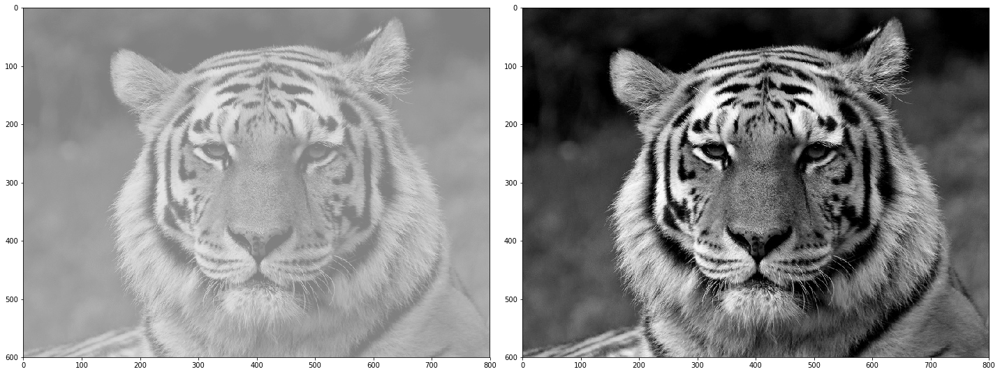

In [6]:
compare_img(img, autocontrast(img))

### Сравнение с эталонным результатом

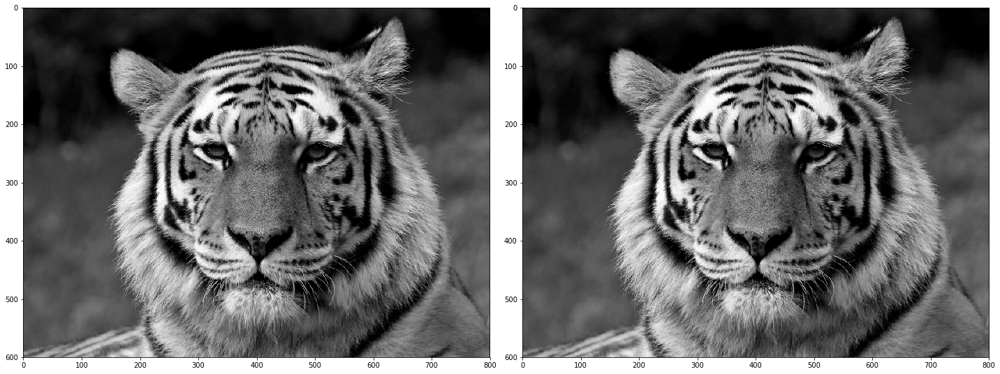

In [7]:
img_ref = imread('https://stepik.org/media/attachments/lesson/58402/tiger-high-contrast.png')
compare_img(autocontrast(img),img_ref)

## Устойчивый автоконтраст

In [8]:
def stable_autocontrast(original_img):
    
    img = original_img.copy().astype(float)
    k = round(img.shape[0]*img.shape[1]*0.05)
    img_sort = img.copy().ravel()
    img_sort.sort()
    color_min = img_sort[k]
    color_max = img_sort[len(img_sort) - k]
    img = (img - color_min) * 255 / (color_max - color_min)
    img = clip(img, 0, 255)
    
    return img.astype('uint8')

### Сравнение изображения с автоконтрастом и изображения с устойчивым автоконтрастом 

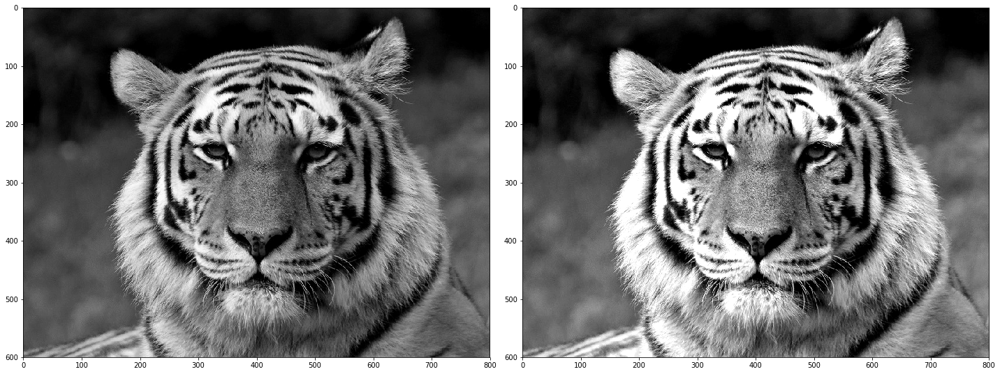

In [9]:
compare_img(autocontrast(img), stable_autocontrast(img))

### Сравнение с эталонным результатом

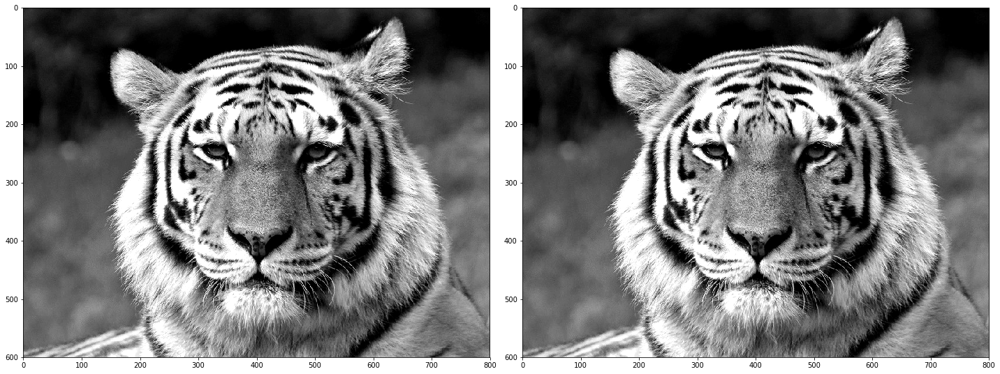

In [10]:
img_ref = imread('https://stepik.org/media/attachments/lesson/58402/tiger-stable-contrast.png')
compare_img(stable_autocontrast(img),img_ref)

## Коррекция контраста цветного изображения

In [11]:
imgTiger = imread('https://stepik.org/media/attachments/lesson/60609/tiger-color.png')

In [12]:
def stack_img(red, green, blue):
    return dstack((red, green, blue))

def rgb_to_channels(img):
    r = img[:,:,0]
    g = img[:,:,1]
    b = img[:,:,2]
    return r, g, b

def rgb_to_yuv(r, g, b):
    y = 0.2126*r + 0.7152*g + 0.0722*b
    u = -0.0999*r - 0.3360*g + 0.4360*b
    v = 0.6150*r - 0.5586*g - 0.0563*b
    return y, u, v

def yuv_to_rgb(y, u, v): 
    r = y + 1.2803 *v
    g = y - 0.2148 *u - 0.3805 *v
    b = y + 2.1279 *u
    return r, g, b

def linear_stretching_yuv(y, Xmax, Xmin):
    Y_modify = (y - Xmin) * 255 / (Xmax - Xmin)
    return clip(Y_modify, 0, 255)

In [13]:
def color_autocontrast(image_original): #устойчивый цветной автоконтраст
    img = image_original.copy()
    img = img.astype('float')
    
    r, g, b = rgb_to_channels(img)    
    y, u, v = rgb_to_yuv(r, g, b)    
    k = round(img.shape[0]*img.shape[1]*0.05)
    
    Y_sort = y.copy().ravel()
    Y_sort.sort()   
    Xmin = Y_sort[k]
    Xmax = Y_sort[len(Y_sort) - k]
    
    Y_modify = linear_stretching_yuv(y, Xmax, Xmin) 
    R_contrast, G_contrast, B_contrast = yuv_to_rgb(Y_modify, u, v)    
    img_contrast = stack_img(R_contrast, G_contrast, B_contrast)    
    img_contrast = clip(img_contrast,0,255)    
    return img_contrast.astype('uint8')

### Сравнение оригинала и изображения с устойчивым цветным автоконтрастом 

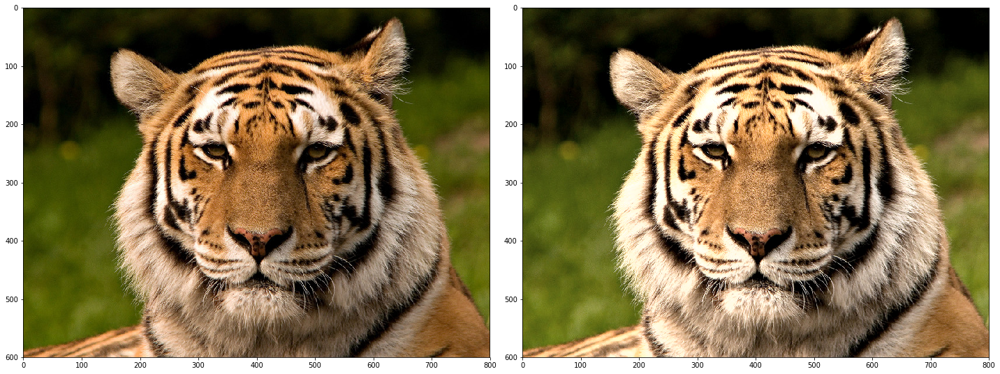

In [14]:
compare_img(imgTiger, color_autocontrast(imgTiger))

### Сравнение с эталонным результатом

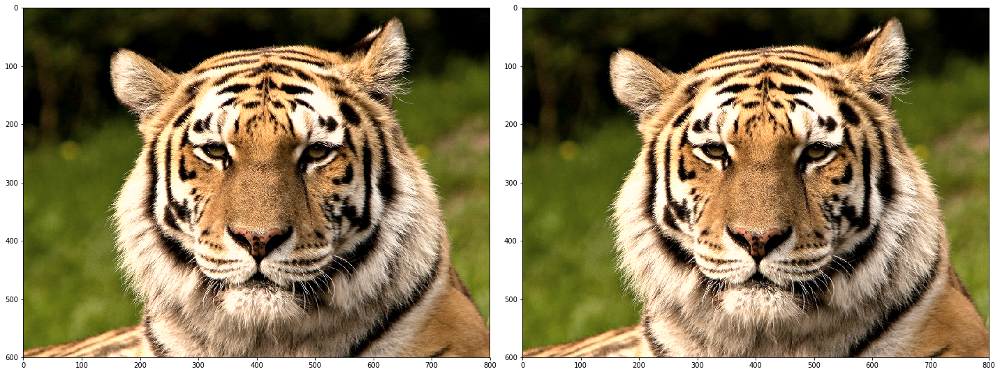

In [15]:
imgTiger_ref = imread('https://stepik.org/media/attachments/lesson/60609/tiger-stable-contrast.png')
compare_img(color_autocontrast(imgTiger),imgTiger_ref)

## Баланс белого

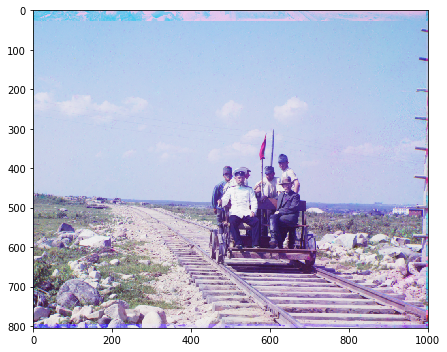

In [16]:
img_rail=imread('https://stepik.org/media/attachments/lesson/60610/railroad.png')
plt.figure(figsize=(10,5))
imshow(img_rail)

In [17]:
def white_balance(image_original):
    img = image_original.copy()
    img = img.astype('float')
    
    r, g, b = rgb_to_channels(img)
    
    R_ravel = r.ravel()
    G_ravel = g.ravel()
    B_ravel = b.ravel()
    
    avg=(average(R_ravel)+average(G_ravel)+average(B_ravel))/3
    
    RW = average(R_ravel)/avg
    GW = average(G_ravel)/avg
    BW = average(B_ravel)/avg
    
    r=r/RW
    g=g/GW
    b=b/BW
    
    img_balanced = stack_img(r, g, b)
    img_balanced = clip(img_balanced, 0, 255)
    
    return img_balanced.astype('uint8')

### Сравнение оригинала и изображения с настроенным Балансом белого

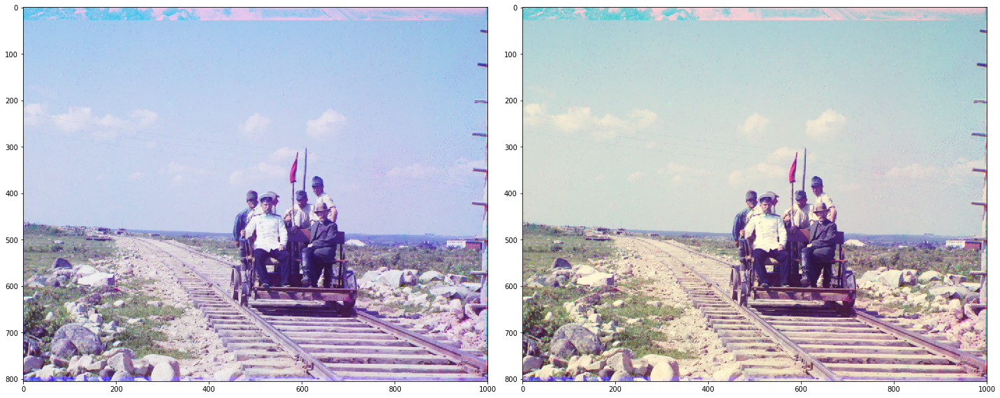

In [18]:
compare_img(img_rail, white_balance(img_rail))

### Сравнение с эталонным результатом

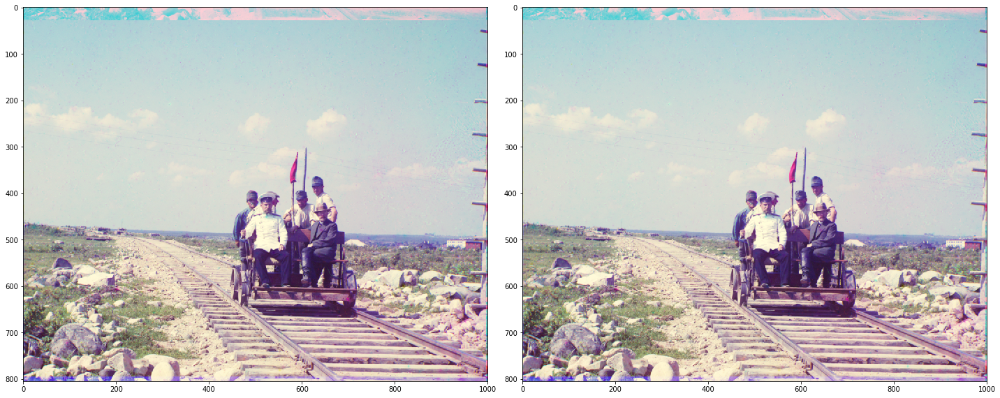

In [19]:
img_rail_ref = imread('https://stepik.org/media/attachments/lesson/60610/railroad-gray-world.png')
compare_img(white_balance(img_rail),img_rail_ref)

## Выравнивание гистограммы

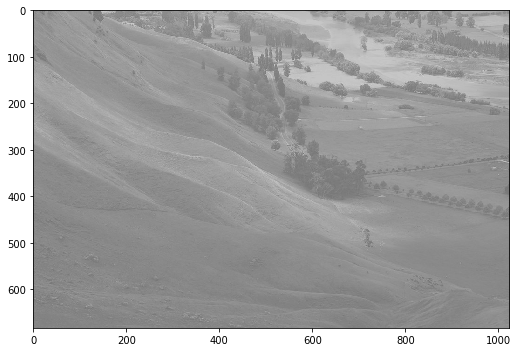

In [20]:
img_hist=imread('https://stepik.org/media/attachments/lesson/60611/landscape.png')
plt.figure(figsize=(10,5))
imshow(img_hist)

### Исходная гистограмма изображения

In [31]:
def make_histogram(img):
    hist=np.zeros(256,np.int32)

    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            value=img[i][j]
            hist[value]+=1

    return hist

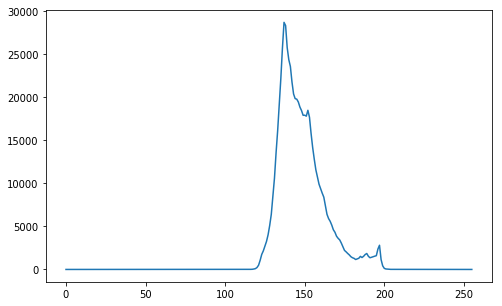

In [40]:
plt.figure(figsize=(8,5))
plt.plot(make_histogram(img_hist))
plt.show()

In [33]:
def make_cdf(hist):
    cdf=np.zeros(256,np.int32)
    for i in range(256):
        cdf[i]=sum(hist[0:i])
    return cdf

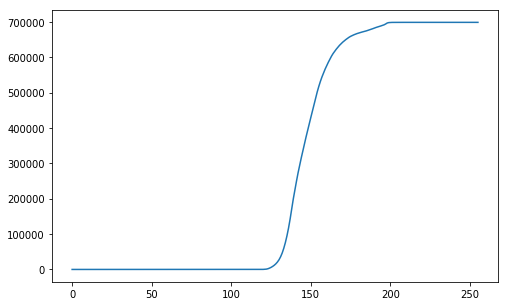

In [39]:
plt.figure(figsize=(8,5))
plt.plot(make_cdf(make_histogram(img_hist)))
plt.show()

In [25]:
def correct_cdf(cdf, img):
    height = img.shape[0]
    width = img.shape[1]
    hist = np.zeros((height,width))
    cdf_min = min(cdf > 0)
    for i in range(height):
        for j in range(width):
            x = img[i][j]
            hist[i][j] = round((cdf[x] - cdf_min)/(height * width - 1) * 255)
            
    return hist

def hist_correction(img):
    cdf = make_cdf(make_histogram(img))    
    img_corrected = correct_cdf(cdf, img)
    img_corrected = clip(img_corrected, 0, 255)    
    return img_corrected.astype('uint8')

### Выровненная гистограмма изображения

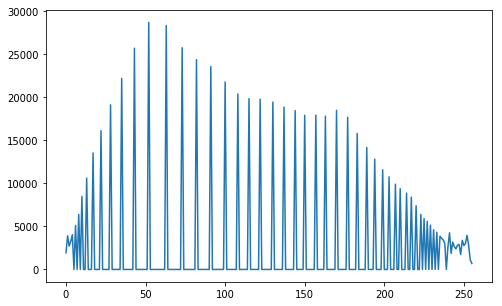

In [42]:
plt.figure(figsize=(8,5))
img_hist1=hist_correction(img_hist)
plt.plot(make_histogram(img_hist1))
plt.show()

### Сравнение оригинала и изображения с выровненной гистограммой

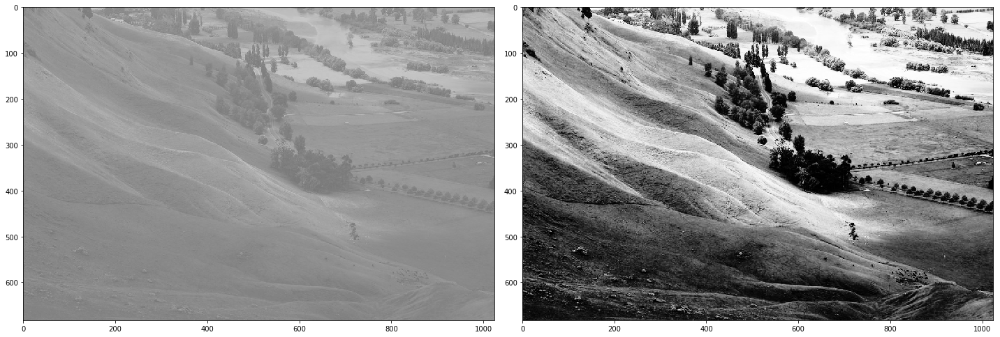

In [28]:
compare_img(img_hist, hist_correction(img_hist))

### Сравнение с эталонным результатом

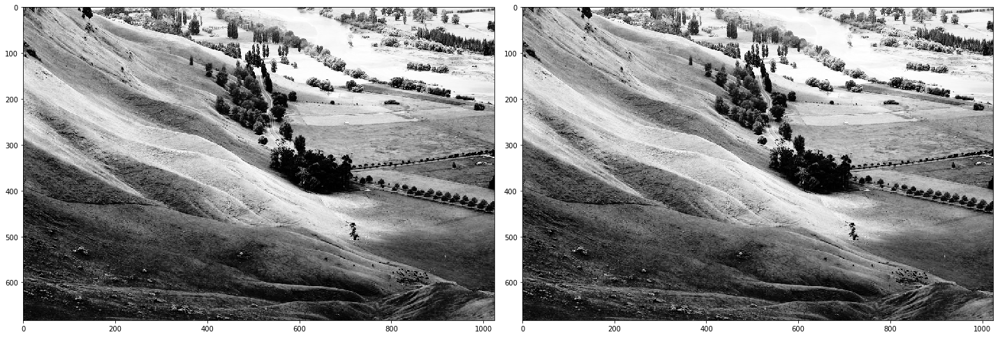

In [29]:
img_hist_ref = imread('https://stepik.org/media/attachments/lesson/60611/landscape-histeq.png')
compare_img(hist_correction(img_hist),img_hist_ref)